# Physiological noise removal

This work is based on the excellent tutorials created by the MNE and MNE-NIRS developers:

- **MNE**: [Tutorials](https://mne.tools/stable/auto_tutorials/index.html)
- **MNE-NIRS**: [Examples](https://mne.tools/mne-nirs/stable/auto_examples/index.html)


## Table of Contents
* [Pre-processing](#chapter_1)
    * [Load python modules](#section_1_1)
    * [Import data](#section_1_2)
        * [Import snirf data](#sub_section_1_2_1)
        * [Add info to raw intensity data](#sub_section_1_2_2)
    * [Short channel regression](#section_1_3)
        * [Method of Saager and Berger](#sub_section_1_3_2)
        * [Via unconstrained projection](#sub_section_1_3_3)
        * [Via image reconstruction](#sub_section_1_3_4)
    * [Global component derived from the mean or median](#section_1_4)
        * [Method of Saager and Berger](#sub_section_1_4_1)
        * [Via unconstrained projection](#sub_section_1_4_2)
        * [Via image reconstruction](#sub_section_1_4_3)
    * [Signal processing methods](#section_1_5)
        * [Bandpass filtering](#sub_section_1_5_1)
        * [Principal Component Analysis (PCA)](#sub_section_1_5_2)
        * [Independent Component Analysis (ICA)](#sub_section_1_5_3)
        * [Fitting Oscillations & One Over F (FOOOF)](#sub_section_1_5_4)
        * [Adaptive filtering](#sub_section_1_5_5) 
    <!-- * [Epoching](#section_1_4) 
        * [Define the range of epochs, the rejection criteria, baseline correction and extract the epochs](#sub_section_1_4_1)
        * [Topographic representation of activity](#sub_section_1_4_2)
        * [View consistency of responses across trials](#sub_section_1_4_3)
        * [View consistency of responses across channels](#sub_section_1_4_4)
        * [Plot standard fNIRS response image](#sub_section_1_4_5)
        * [Topographic representation of activity](#sub_section_1_4_6)
        * [Compare tapping of left and right hands](#sub_section_1_4_7)
* [Statistical analysis](#chapter_2)
    * [Statistical summary](#section_2_1) 
        * [Sub Section 2.1.1](#sub_section_2_1_1)
        * [Sub Section 2.1.2](#sub_section_2_1_2)
    * [Statistical comparison of conditions](#section_2_2) 
    * [Traditional Statistics](#section_2_3) -->

## Pre-processing <a class="anchor" id="chapter_1"></a>

---
### Load python modules <a class="anchor" id="section_1_1"></a>

In [1]:
# Import the needed modules 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mne
import mne_nirs
import pywt
import scipy
import dabest
from itertools import compress
from mne.preprocessing.nirs import scalp_coupling_index, optical_density, temporal_derivative_distribution_repair, beer_lambert_law, _validate_nirs_info, source_detector_distances
from mne_nirs.preprocessing import peak_power, scalp_coupling_index_windowed, quantify_mayer_fooof
from mne_nirs.visualisation import plot_timechannel_quality_metric
from mne_nirs.channels import get_short_channels, get_long_channels, picks_pair_to_idx
from mne_nirs.signal_enhancement import short_channel_regression
from mne_nirs.experimental_design import make_first_level_design_matrix
from mne.preprocessing import ICA, corrmap
from scipy.stats import norm, ttest_1samp, kurtosis, pearsonr
from scipy.signal import wiener
from scipy.interpolate import CubicSpline
from fooof import FOOOF
from csaps import csaps
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import StandardScaler

C:\ProgramData\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,
C:\Users\fabia\AppData\Local\Temp\ipykernel_27556\1002167252.py:22: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


In [2]:
# Write own fucntions
def reorder(raw_initial):
    """
    Input: raw object
    Function: reorders the channels to match the MNE standard
    """
    raw = raw_initial.copy()
    channel_names = raw.ch_names
    channel_names_ordered = []
    for i in range(0, int(len(channel_names)/2)):
        channel_names_ordered.append(channel_names[i])
        channel_names_ordered.append(channel_names[(i + int(len(channel_names)/2))])
    raw_ordered = raw.reorder_channels(channel_names_ordered)
    return raw_ordered

def add_info(raw_intensity, first_name, last_name, age, sex, EHI, annotations, duration_annotation, duration_rest, N_control):
    """
    Input: raw object, first name, last name, age, sex, EHI, annotations, duration of annotation, duration of baseline period, # of control trials
    Function: Returns raw object with added subject info and random allocated control trials within the baseline period
    """
    raw = raw_intensity.copy()
    
    # Add subject info
    raw.info["subject_info"] = {'first_name' : first_name, 'last_name' : last_name, 'age' : age, 'sex' : sex, 'EHI' : EHI}
    
    # attribute meaningful names to trigger codes. Include information about the duration of each stimulus (10 seconds). 
    raw.annotations.set_durations(duration_annotation)
    raw.annotations.rename(annotations)
    
    events, event_dict = mne.events_from_annotations(raw)
    
    # Define begin and end of rest period
    begin_rest = np.ceil(events[np.where(events[:,2] == event_dict['Baseline'])[0][0],0]/raw.info['sfreq'])
    end_rest = begin_rest + duration_rest - duration_annotation 
    
    # Remove start indicator of rest period
    raw.annotations.delete(np.nonzero(raw.annotations.description == "Baseline"))
    
    # Define indices of random selected control trials
    indices = np.random.choice(np.arange(begin_rest, end_rest), N_control, replace = False).astype(int)
    raw.annotations.append(indices, [duration_annotation]*N_control, ["Baseline"]*N_control)
    
    return raw

def crop(raw_input, t_before = 10, t_after = 60):
    """
    Input: raw object, time interval length before first event and time interval length after last event that should be included in the recording
    Function: crops raw object to a recording starting 't_before' s (default 10 s) before the first annotated event and ending 't_after' s (default 60 s) after the last event 
    """
    raw = raw_input.copy()
    end_rec = raw.get_data().shape[1]/raw.info['sfreq']
    t_start = events[0,0]/raw.info['sfreq'] - t_before
    t_end = events[-1,0]/raw.info['sfreq'] + t_after
    if t_start < 10:
        t_start = 0
    if t_end > end_rec:
        t_end = end_rec
    raw.crop(t_start, t_end)
    return raw

def get_indices(array, target_array):
    """
    Input: complete array of channel names, array of channels names to be removed
    Function: gives back indices of desired channels
    """
    lst = list(array)
    indices = list(np.arange(0, len(array)))
    for target in target_array:
        if target in lst:
            indices.remove(lst.index(target))
    return indices

def ch_names_L_R(raw):
    """
    Input: raw object
    Function: Separate list of channel names in 2 lists for the left and right hemisphere respectively
    """
    left, right = [], []
    for ch in raw.ch_names:
        if (int(ch[1]) % 2) == 0:
            right.append(ch)
        else:
            left.append(ch)
    return left, right

def scale_up_spectra(spectra, freqs):
    """
    Input: spectra, freqs
    Function: FOOOF requires the frequency values to be higher than the fNIRS data permits, 
    so we scale the values up by 10 here, and then will scale
    the frequency values down by 10 later.
    """
    freqs = freqs * 10
    return spectra, freqs

def get_IMU_data(filename, plot = False):
    """
    Extract IMU data from text file.
    Input: filename with .txt, plot (bool)
    Output: Three dataframes containing the complete IMU data, the accelerometer data and the gyroscope data respectively
    """
    
    # Read .txt file and convert to dataframe
    df = pd.read_csv(filename, sep=';', header=None, names=["time", "battery", "channels", "gyroX", "gyroY", "gyroZ", "accX", "accY", "accZ", "marker", "_"])

    # Select IMU data
    data = df.drop(0)
    markers = data["marker"].astype(float)
    IMU_data = data.drop(columns =['time', 'battery', 'channels', 'marker', '_']).astype(float)

    gyro_data = IMU_data.drop(columns = ['accX', 'accY', 'accZ'])
    acc_data = IMU_data.drop(columns = ["gyroX", "gyroY", "gyroZ"])
    
    if plot: 
        %matplotlib inline
        gyro_data.plot(title='Gyroscope data', grid = True, xlabel = 'samples', ylabel = 'dps')
        acc_data.plot(title='Accelerometer data', grid = True, xlabel = 'samples', ylabel = 'm/s^2')

    return IMU_data, acc_data, gyro_data

In [3]:
# Set plot characteristics
%matplotlib inline
sns.set_theme() # nicer plots
# Load external plots?
plot = False

### Import data <a class="anchor" id="section_1_2"></a>

#### Import snirf data <a class="anchor" id="sub_section_1_2_1"></a>

In [4]:
filename = 'FTT1.snirf'

In [5]:
# Read snirf data
raw = mne.io.read_raw_snirf(filename, optode_frame='unknown', preload=False, verbose=None)

Loading C:\Users\fabia\fNIRS data analysis\FTT analysis\FTT1\FTT1.snirf


In [6]:
# Reorder channels (Due to non-uniformity between mne_nirs and .snirf data)
raw_intensity = reorder(raw)

#### Add info to raw intensity data <a class="anchor" id="sub_section_1_2_2"></a>

In [7]:
# Use self-written function to add info about the subject and the recording
annotations = {"1": "Baseline", "2": "Grasping/Right", "3": "Grasping/Left"}
raw_intensity = add_info(raw_intensity, 'Subject', '1', 26, 'male', 'right', annotations, 10, 60, 10)

Used Annotations descriptions: ['Baseline', 'Grasping/Left', 'Grasping/Right']


In [61]:
# Look at characteristics
raw_intensity

<RawSNIRF | hand grasp 2_polak__20240215-131236.snirf, 52 x 4394 (852.2 s), ~52 kB, data not loaded>

Used Annotations descriptions: ['Baseline', 'Grasping/Left', 'Grasping/Right']


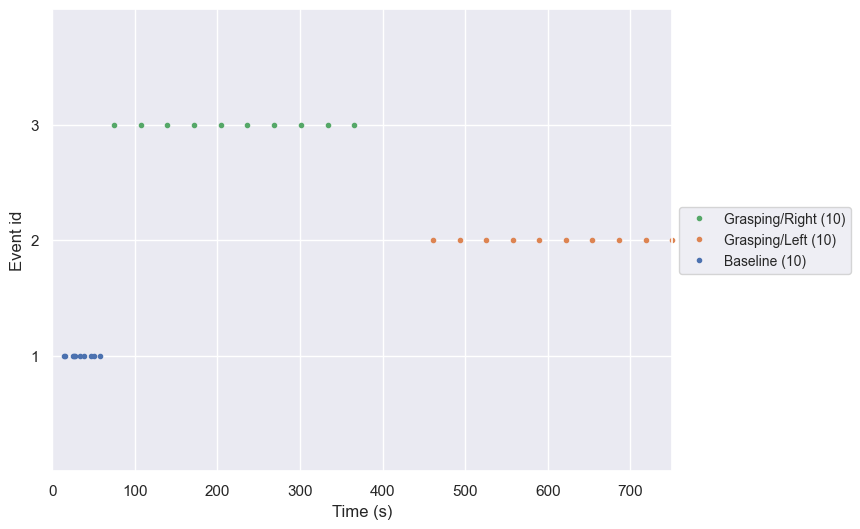

In [62]:
# Look at segments
events, event_dict = mne.events_from_annotations(raw_intensity)
plt.rcParams["figure.figsize"] = (10, 6) # (w, h)
mne.viz.plot_events(events, event_id=event_dict, sfreq=raw_intensity.info['sfreq']);

In [63]:
# As a table
raw_intensity.annotations.to_data_frame()

,onset,duration,description
0,2024-02-15 13:12:50.000,10.0,Baseline
1,2024-02-15 13:12:51.000,10.0,Baseline
2,2024-02-15 13:13:01.000,10.0,Baseline
3,2024-02-15 13:13:02.000,10.0,Baseline
4,2024-02-15 13:13:03.000,10.0,Baseline
5,2024-02-15 13:13:10.000,10.0,Baseline
6,2024-02-15 13:13:15.000,10.0,Baseline
7,2024-02-15 13:13:23.000,10.0,Baseline
8,2024-02-15 13:13:27.000,10.0,Baseline
9,2024-02-15 13:13:34.000,10.0,Baseline


---
> *Remark:*
- 26 channels * 2 wavelengths = 52 channels
- sample frequency = 5.15 Hz
- LPF = 2.58 Hz -  What filter?
- 10 random selected control segments within the baseline recording period
- 10 left and 10 right hand grasping segments
---

##### Validate that the location of sources-detector pairs and channels are in the expected locations

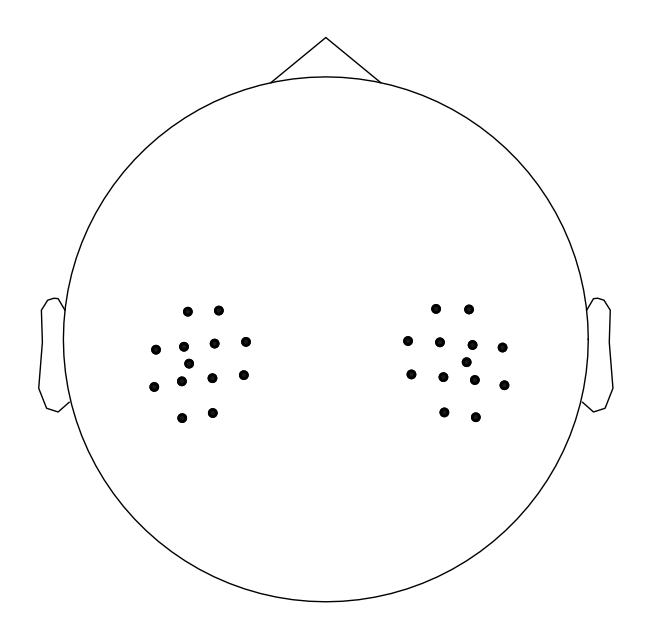

In [64]:
# Plot channels in 2D using build-in function of mne_nirs
sns.reset_defaults() # Turn of sns to be able to also plot contour of head
# dots = Center of channels
%matplotlib inline
raw_intensity.plot_sensors();

In [65]:
sns.set_theme()
if plot:
    # Plot channels in 3D
    subjects_dir = mne.datasets.sample.data_path() / "subjects"
    mne.datasets.fetch_fsaverage(subjects_dir=subjects_dir)

    brain = mne.viz.Brain("fsaverage", subjects_dir=subjects_dir, alpha=0.5, cortex="low_contrast")
    brain.add_head()
    
    identity_trans = mne.transforms.Transform("head", "mri") #transformed coord
    brain.add_sensors(raw_intensity.info, trans=identity_trans, fnirs=["channels", "pairs", "sources", "detectors"])

    # Add ROI (Primary motor cortex (precentral gyrus))
    brain.add_label("BA4a", hemi = "lh", borders=False, color='blue')
    brain.add_label("BA4a", hemi = "rh", borders=False, color='blue')
    brain.add_label("BA4p", hemi = "lh", borders=False, color='blue')
    brain.add_label("BA4p", hemi = "rh", borders=False, color='blue')


    brain.show_view(azimuth=90, elevation=90, distance=500)

---
> *Remark:*
- 24 long channels and 2 short channels
- 8 sources, 10 detectors and 2 short channel sources
- montage located above sensorimotor cortex
---

##### Visual inspection of the raw light intensity data

In [66]:
# Plot raw data with build-in plot function of mne_nirs
if plot:
    %matplotlib qt
    raw_intensity.plot(duration=300, show_scrollbars = True, clipping = None);

---
> *Remark:*
- Physiological components: abc
- Extrinsic components: abc
---

##### Visual inspection of the the optical density 

The OD or the attenuation of incident light, can be calculated as the logarithmic ratio of the input light intensity ($I_{in}$) and the detected light intensity ($I_{out}$):
$$OD_\lambda = \log \left(\frac{I_{in}}{I_{out}}\right)$$

In [67]:
# Convert raw intensity data to OD with build-in function of mne_nirs
raw_od = optical_density(raw_intensity)

Reading 0 ... 4393  =      0.000 ...   852.242 secs...


In [68]:
# Plot OD
if plot:
    %matplotlib qt
    raw_od.plot(duration=300, show_scrollbars = True, clipping = None);

---
> *Remark:*
- Physiological components: abc
- Extrinsic components: abc
---

##### Visual inspection of the haemoglobin concentration

By solving the Beer-Lambert law for two measurement wavelengths on either side of the isosbestic point - the point where the HbR and HbO spectra cross, the unknows can be eliminated from the equation. Small changes of attenuation for both wavelengths, due to changes in  HbR and HbO concentrations, can be detected with the following formula:
$$ \Delta OD_\lambda = \log \left(\frac{I_{rest}}{I_{test}}\right) \ \approx \epsilon_\lambda^{HbR} \cdot \Delta c^{HbR} \cdot L + \epsilon_\lambda^{HbO} \cdot \Delta c^{HbO} \cdot L $$
From the two resulting equations, one for each wavelength, the chromophore concentrations can be found:
$$ [HbO] = \frac{a_{HbO}^{\lambda_2} \cdot \Delta A_{\lambda_1} - a_{HbR}^{\lambda_1} \cdot \Delta A_{\lambda_2}}{L \cdot (a_{HbO}^{\lambda_1} \cdot a_{HbR}^{\lambda_2} - a_{HbO}^{\lambda_2} \cdot a_{HbR}^{\lambda_1})} $$
$$ [HbR] = \frac{a_{HbO}^{\lambda_1} \cdot \Delta A_{\lambda_2} - a_{HbR}^{\lambda_2} \cdot \Delta A_{\lambda_1}}{L \cdot (a_{HbO}^{\lambda_1} \cdot a_{HbR}^{\lambda_2} - a_{HbO}^{\lambda_2} \cdot a_{HbR}^{\lambda_1})}$$

In [69]:
# Convert OD to haemoglobin concentration with build-in function of mne_nirs
# Constant ppf value: PPF = DPF/PVC
raw_haemo = beer_lambert_law(raw_od, ppf=6) # ppf=6 is more inline with the community expectations and makes our results easier compared to the majority of the existing literature.

---
> *Remark:*
- abc
---

### Short channel regression <a class="anchor" id="section_1_3"></a>

#### Method of Saager and Berger <a class="anchor" id="sub_section_1_3_2"></a>

The reflectance measurements at two detectors, L and S, allow for the calculation of absorbance changes $\Delta A_L (t)$ and $\Delta A_S (t)$. To eliminate the influence of the superficial component of the probed tissue, measurements can be taken using two SDD: long and short. This can be achieved using the equation:
$$ \Delta A_C (\lambda, t) = \Delta A_L (\lambda, t) - \alpha \cdot \Delta A_S (\lambda, t)$$

Here, $\Delta A_C (\lambda, t)$ represents the corrected attenuation, $\Delta A_L (\lambda, t)$ corresponds to the attenuation at the long SDD (sampling both brain and superficial components), and $\Delta A_S (\lambda, t)$ pertains to the short SDD (sampling only superficial components) (Scholkmann et al., 2014). 

According to Saager and Berger (2005), the scaling parameter $\alpha$ can be determined directly using a least-squares method:

$$\alpha = \frac{\Delta A_S (\lambda, t) \cdot \Delta A_L (\lambda, t)}{\Delta A_S (\lambda, t) \cdot \Delta A_S (\lambda, t)}$$


In [70]:
# Short channels predominantly contain systemic responses and long channels have both neural and systemic contribution
raw_od_SCR_SB = short_channel_regression(raw_od, max_dist=0.01)

In [71]:
# Plot result with build-in plot function of mne_nirs
if plot:
    %matplotlib qt
    raw_od_SCR_SB.plot(duration=300, show_scrollbars = True, clipping = None);

---
> *Remark:*
- a
- b
- c   
---

#### Via unconstrained projection - NOT FINISHED <a class="anchor" id="sub_section_1_3_3"></a>

hort-separation data can also be removed from the longer-separation channels to better isolate brain signals using the following projection method:

$$ Y_{filtered} = [\mathbf{I} - \mathbf{X_{short}} \cdot (\mathbf{X_{short}}^T \cdot \mathbf{X_{short}})^{-1} \cdot \mathbf{X_{short}}^T] \cdot Y_{long} $$

In this equation, $\mathbf{X_{short}}$ is a matrix formed from one or more short-separation time courses. This method is referred to as \textit{unconstrained projection} because it does not explicitly consider the spatial relationships of measurements or the relative sensitivity between the short and long measurement pairs (Santosa et al., 2020). 

In [72]:
# Short-separation prefiltering via unconstrained projection [DOI: 10.1117/1.NPh.7.3.035009]
def SCR_unconstrained(raw, min_dist = 0.01, max_dist=0.045, plot = False):
    X_short = get_short_channels(raw, max_dist=max_dist).get_data().T # Transpose to comply with dimensions of matrix multiplication
    Y_long = get_long_channels(raw, min_dist=min_dist, max_dist=max_dist).get_data().T # Transpose to comply with dimensions of matrix multiplication

    term = np.eye(len(X_short)) - X_short @ np.linalg.inv(X_short.T @ X_short) @ X_short.T

    Y_filtered = (term @ Y_long).T # Transpose to get right dimensions for raw-object

    raw_out = get_long_channels(raw, min_dist=min_dist, max_dist=max_dist).copy()    
    raw_out._data = Y_filtered

    if plot:
        %matplotlib inline
        t = np.arange(len(Y_long))/raw.info['sfreq']
        for i in range(Y_long.shape[1]):
            plt.plot(t, Y_long.T[i], label = 'Uncorrected')
            plt.plot(t, 100*Y_filtered[i], '--', label = 'Uncorrected')
            plt.legend()
            plt.xlabel('time (s)')
            plt.title('Channel: ' + str(i+1))
            plt.show()

    return Y_filtered, Y_long.T, raw_out

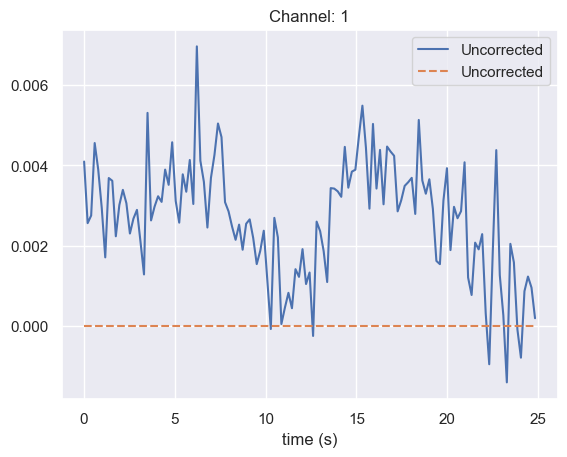

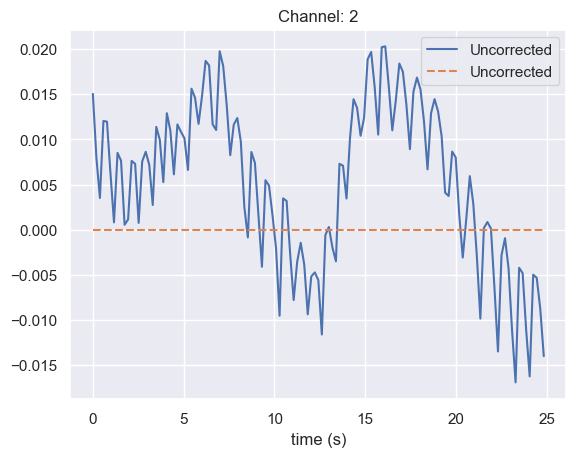

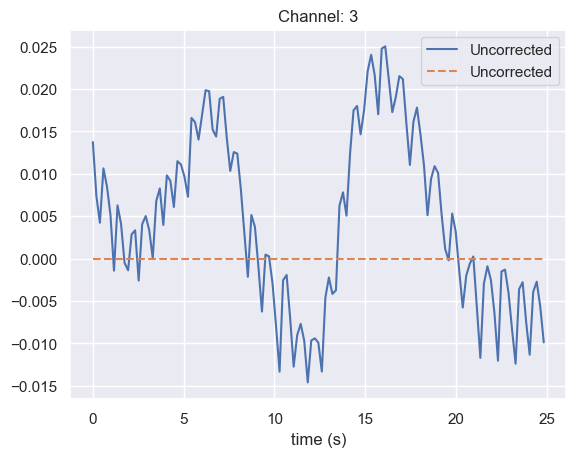

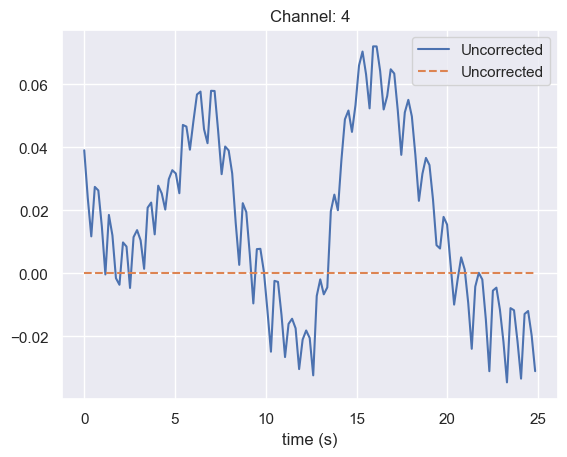

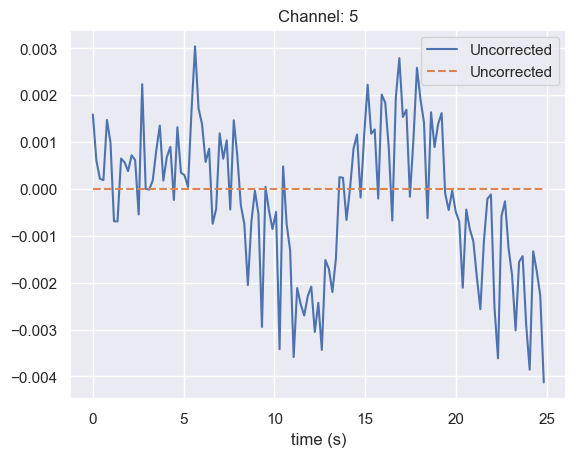

...

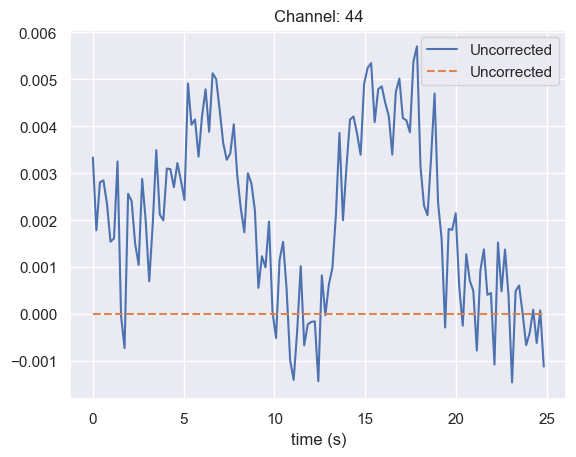

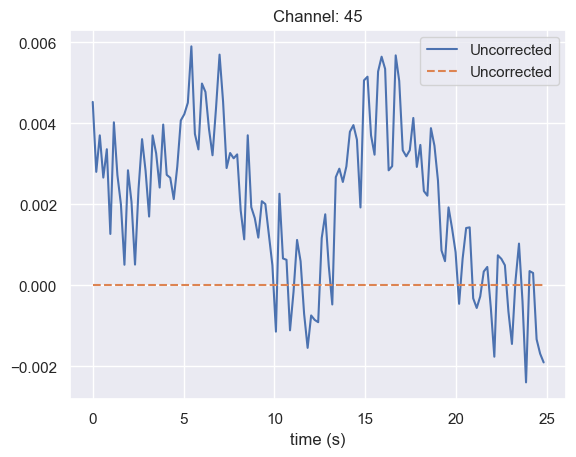

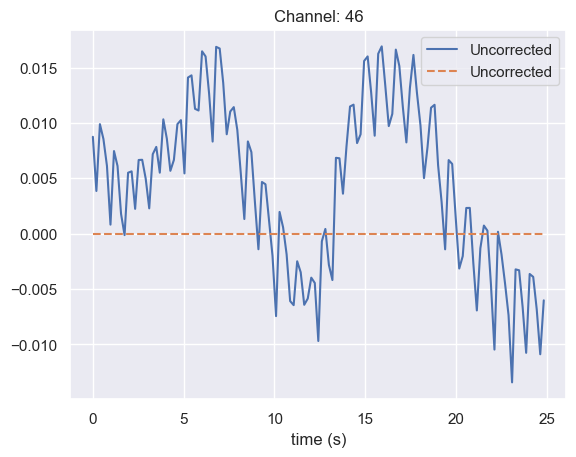

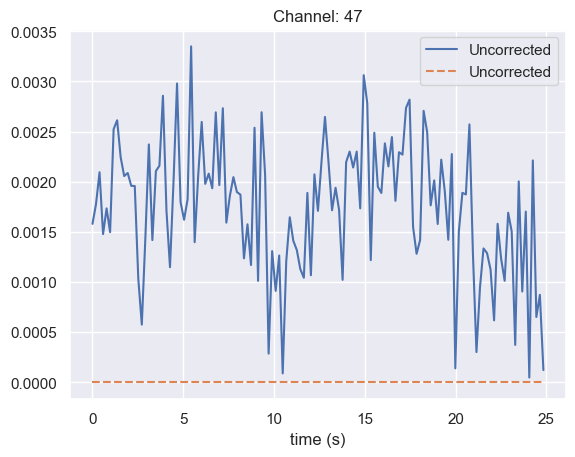

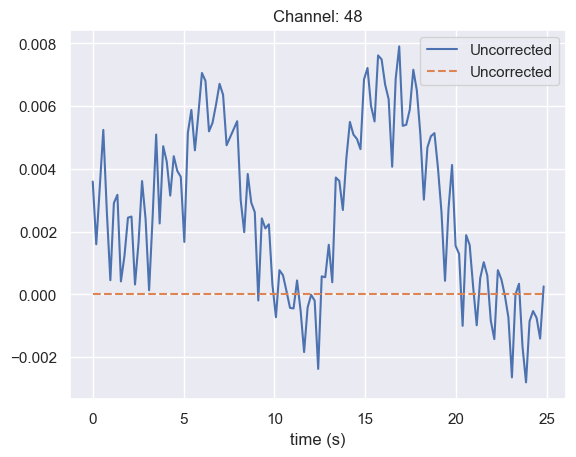

In [73]:
Y, Y_org, raw_od_SCR_Un = SCR_unconstrained(raw_od.copy().crop(275, 300), min_dist = 0.01, max_dist=0.045, plot = True)

In [74]:
# Only long channels remain in new object
raw_od_SCR_Un

<RawSNIRF | hand grasp 2_polak__20240215-131236.snirf, 48 x 129 (24.8 s), ~98 kB, data loaded>

---
> *Remark:*
- Scale problem
- Does it actually wwork?
- c   
---

#### Via image reconstruction - NOT FINISHED <a class="anchor" id="sub_section_1_3_4"></a>

In this approach, incorporating information regarding the relative sensitivity of measurements to brain and skin tissues is facilitated through the optical forward model, which elucidates how light propagates through the tissue. Gregg et al. (2010) introduced a fundamental fNIRS image reconstruction model aimed at eliminating superficial noise signals by considering the anticipated sensitivity of each measurement to the skin, along with assumptions about the lower spatial frequency of signals in the superficial layer. According to Santosa et al. (2020), this image reconstruction-based correction can be realized with the following model:

$$  Y_{filtered}^T = [\mathbf{I} - \mathbf{L} \cdot \mathbf{S} \cdot (\mathbf{S}^T \cdot \mathbf{L}^T \cdot \mathbf{L} \cdot \mathbf{S} + \lambda \cdot \mathbf{I})^{-1} \cdot \mathbf{S}^T \cdot \mathbf{L}^T] \cdot Y_{long}^T $$

Here, $\mathbf{L}$ represents the partial optical forward model (matrix) characterizing the sensitivity of all fNIRS measurements (both short and long distance) to a skin layer, $\lambda$ denotes the stabilizing hyperparameter, and $\mathbf{S}$ constitutes a low-spatial frequency basis set utilized for spatial smoothing in the reconstructed skin image. For instance, $\mathbf{S}$ could be generated from a Gaussian smoothing kernel or spatial wavelets. 

In [75]:
# Not yet fixed

---
> *Remark:*
- How to find L and S matrix? Related to DOT so maybe look back later?
- Does it actually work?
- c   
---

### Global component derived from the mean or median <a class="anchor" id="section_1_4"></a>

It is worth noting that the short channel regression techniques discussed earlier can also be adapted by using the global component derived from the mean or median of all channels. This approach estimates systemic physiological changes common across channels and filters them from each channel, further improving the isolation of neural signals.

#### Method of Saager and Berger <a class="anchor" id="sub_section_1_4_1"></a>

In [76]:
# Based on code of mne_nirs.signal_enhancement._short_channel_correction
def M_regression_SB(raw, min_dist = 0.01, max_dist=0.045, method = 'mean'):
    raw = raw.copy()

    picks_od = mne.pick_types(raw.info, fnirs='fnirs_od')

    if len(picks_od) == 0:
        raise RuntimeError('Data must be optical density.')
    
    distances = source_detector_distances(raw.info)
    picks_long = picks_od[distances[picks_od] > min_dist]

    Y_long = get_long_channels(raw, min_dist=min_dist, max_dist=max_dist).get_data()
    m = np.zeros((2, Y_long.shape[1]))
    
    if method == 'mean':
        m[0] = np.mean(Y_long[::2], axis = 0) # 760 wavelength
        m[1] = np.mean(Y_long[1::2], axis = 0) # 850 wavelength
    elif method == 'median':
        m[0] = np.median(Y_long[::2], axis = 0) # 760 wavelength
        m[1] = np.median(Y_long[1::2], axis = 0) # 850 wavelength


    for pick in picks_long:
        i = pick%2
        A_l = raw.get_data(pick).ravel()
        A_s = m[i].ravel()

        # Eqn 27 Scholkmann et al 2014
        alfa = np.dot(A_s, A_l) / np.dot(A_s, A_s)

        # Eqn 26 Scholkmann et al 2014
        raw._data[pick] = A_l - alfa * A_s

    return raw

##### Estimate global component derived from the mean

In [77]:
raw_od_SB_mean = M_regression_SB(raw_od, min_dist=0.01, method = 'mean')

In [78]:
# Plot result with build-in plot function of mne_nirs
if plot:
    %matplotlib qt
    raw_od_SB_mean.plot(duration=300, show_scrollbars = True, clipping = None);

##### Estimate global component derived from the median

In [79]:
raw_od_SB_median = M_regression_SB(raw_od, min_dist=0.01, method = 'median')

In [80]:
plot = True

In [81]:
# Plot result with build-in plot function of mne_nirs
if plot:
    %matplotlib qt
    raw_od_SB_median.plot(duration=300, show_scrollbars = True, clipping = None);

---
> *Remark:*
- a
- b
- c   
---

#### Via unconstrained projection - NOT FINISHED <a class="anchor" id="sub_section_1_3_3"></a> <a class="anchor" id="sub_section_1_4_2"></a>

In [82]:
# Short-separation prefiltering via unconstrained projection [DOI: 10.1117/1.NPh.7.3.035009]
def M_regression_unconstrained(raw, min_dist = 0.01, max_dist=0.045, method = 'mean', plot = False):

    Y_long = get_long_channels(raw, min_dist=min_dist, max_dist=max_dist).get_data().T # Transpose to comply with dimensions of matrix multiplication

    m = np.zeros((2, len(Y_long)))

    if method == 'mean':
        m[0] = np.mean(Y_long.T[::2], axis = 0) # 760 wavelength
        m[1] = np.mean(Y_long.T[1::2], axis = 0) # 850 wavelength
    elif method == 'median':
        m[0] = np.median(Y_long.T[::2], axis = 0) # 760 wavelength
        m[1] = np.median(Y_long.T[1::2], axis = 0) # 850 wavelength
     
    X = m.T # Transpose to comply with dimensions of matrix multiplication

    term = np.eye(len(X)) - X @ np.linalg.inv(X.T @ X) @ X.T

    Y_filtered = (term @ Y_long).T # Transpose to get right dimensions for raw-object

    raw_out = get_long_channels(raw, min_dist=min_dist, max_dist=max_dist).copy()    
    raw_out._data = Y_filtered

    if plot:
        %matplotlib inline
        t = np.arange(len(Y_long))/raw.info['sfreq']
        for i in range(Y_long.shape[1]):
            plt.plot(t, Y_long.T[i], label = 'Uncorrected')
            plt.plot(t, 100*Y_filtered[i], '--', label = 'Uncorrected')
            plt.legend()
            plt.xlabel('time (s)')
            plt.title('Channel: ' + str(i+1))
            plt.show()

    return Y_filtered, Y_long.T, raw_out

##### Estimate global component derived from the mean

Channels marked as bad:
none


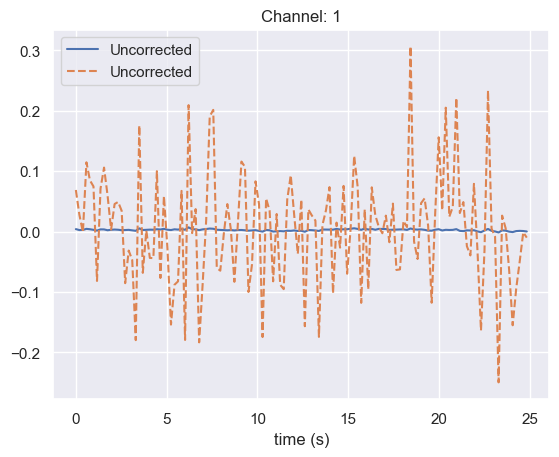

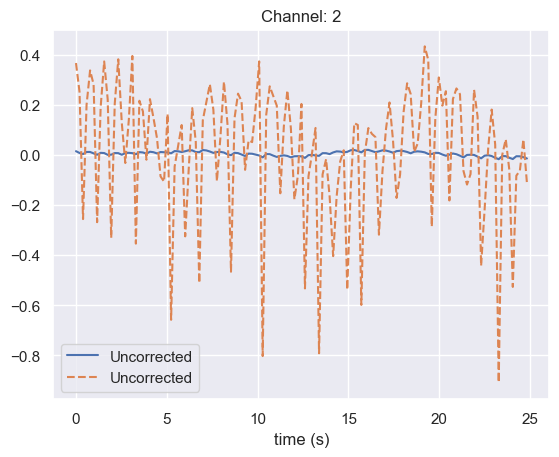

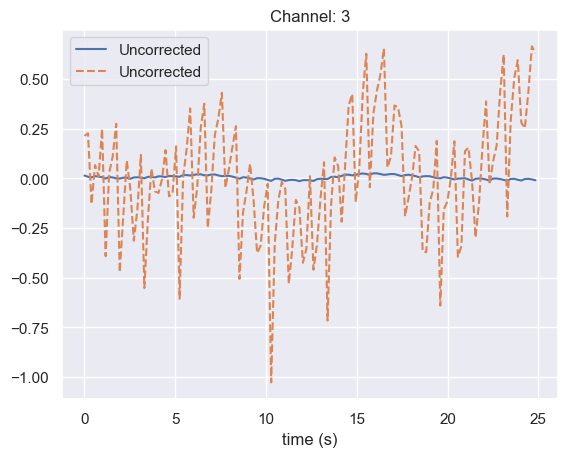

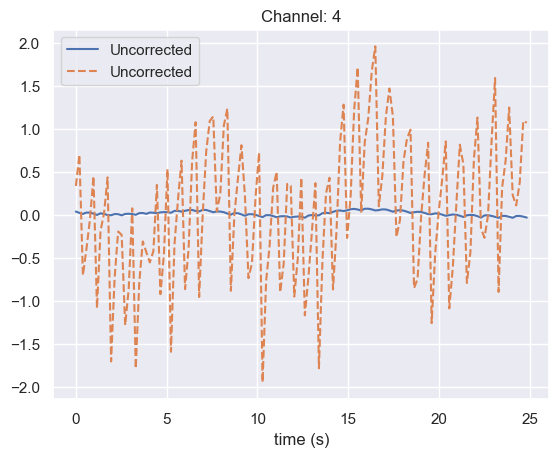

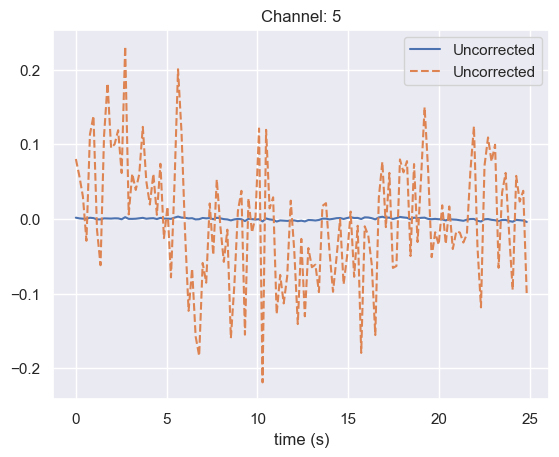

...

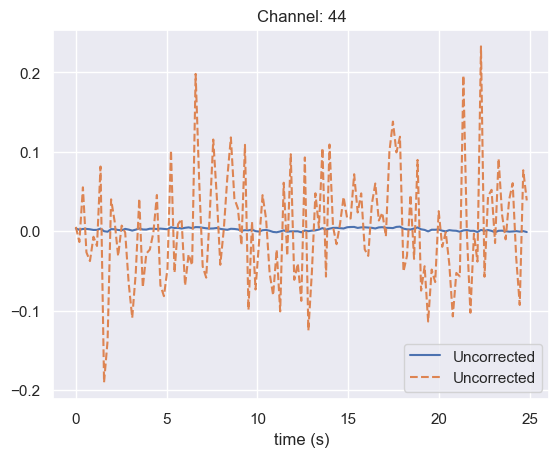

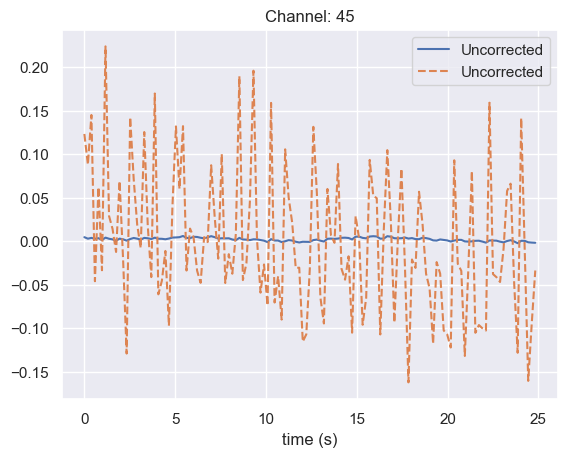

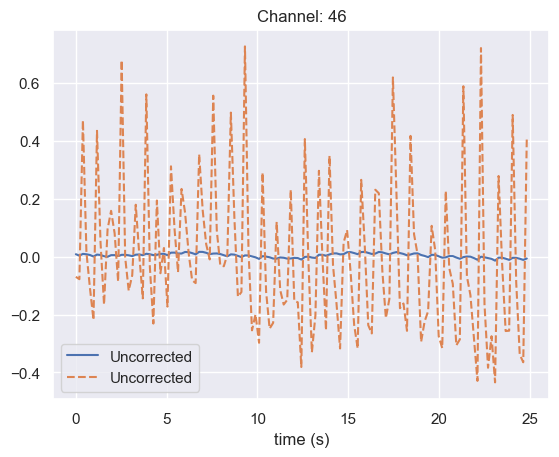

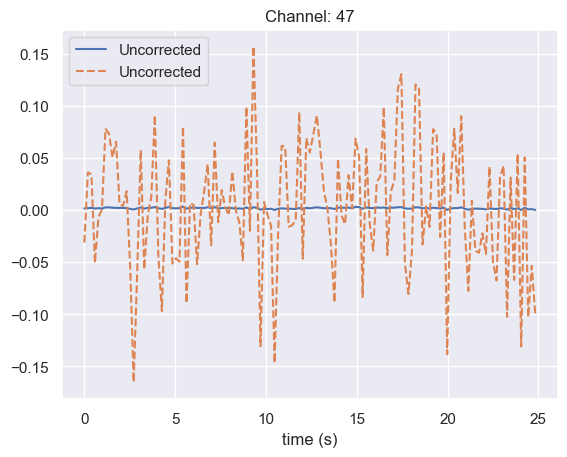

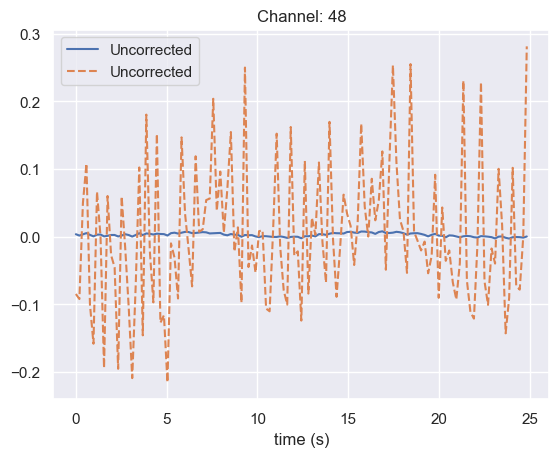

In [83]:
Y, Y_org, raw_od_SCR_Un = M_regression_unconstrained(raw_od.copy().crop(275, 300), min_dist = 0.01, max_dist=0.045, method = 'mean', plot = True)

##### Estimate global component derived from the median

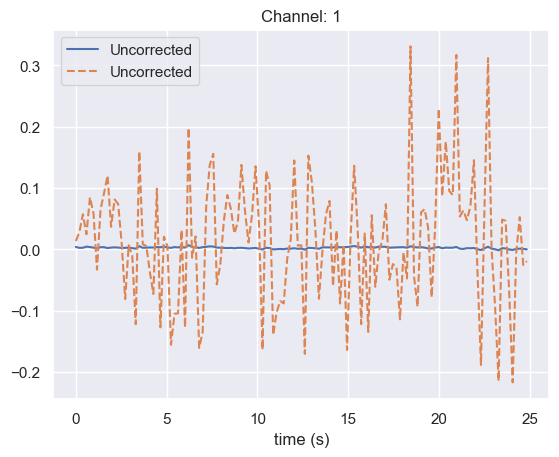

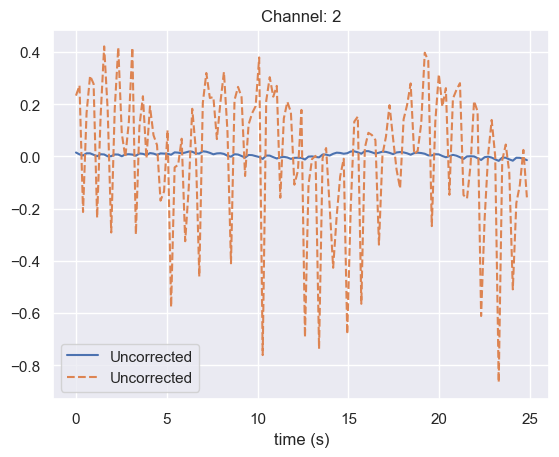

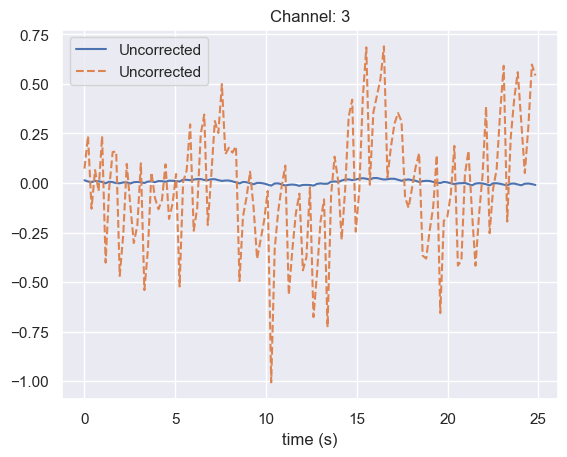

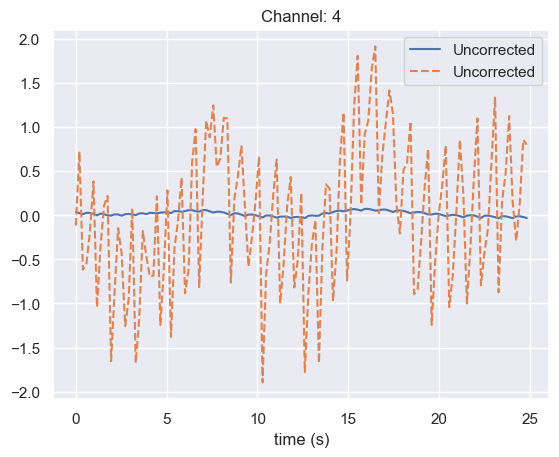

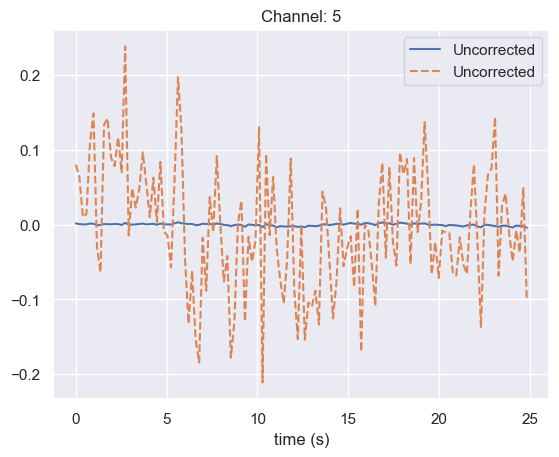

...

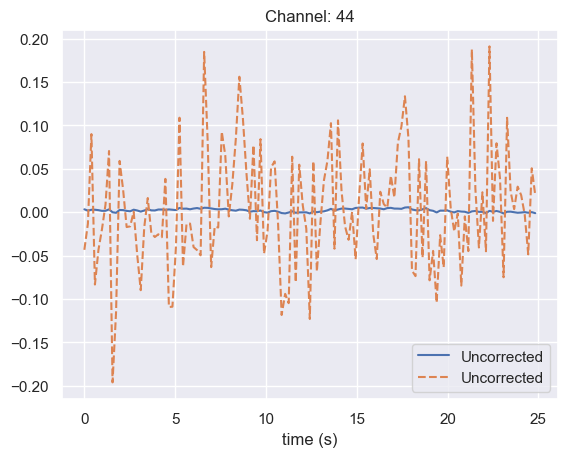

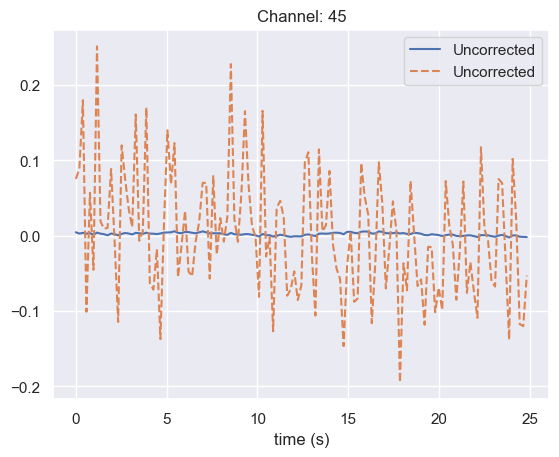

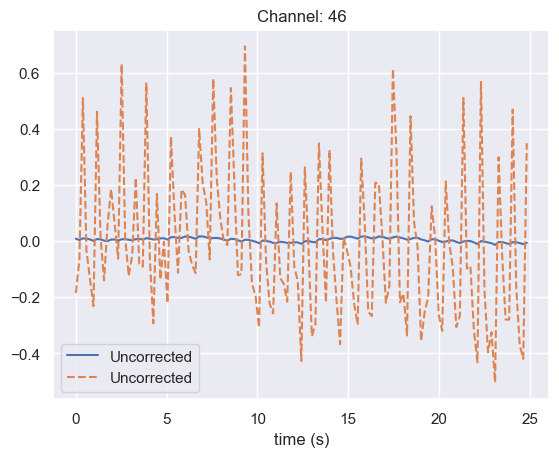

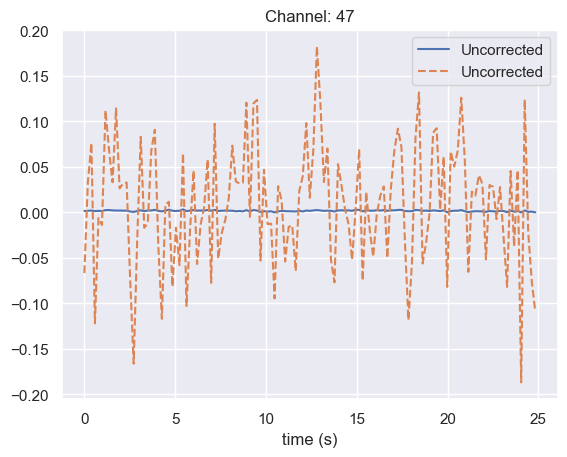

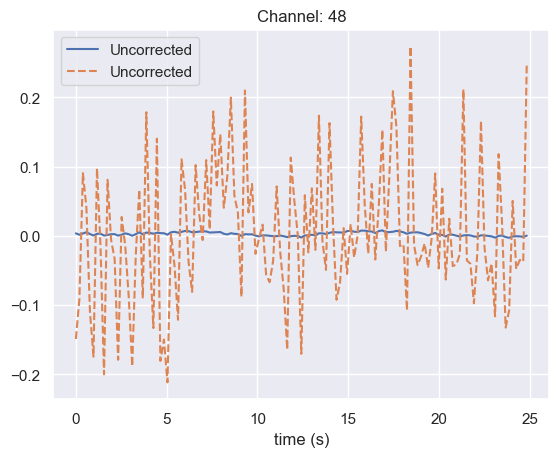

In [84]:
Y, Y_org, raw_od_SCR_Un = M_regression_unconstrained(raw_od.copy().crop(275, 300), min_dist = 0.01, max_dist=0.045, method = 'median', plot = True)

---
> *Remark:*
- a
- b
- c   
---

#### Via image reconstruction - NOT FINISHED <a class="anchor" id="sub_section_1_4_3"></a>

In [85]:
# First fix with SS

### Signal processing methods <a class="anchor" id="section_1_5"></a>

#### Bandpass filtering <a class="anchor" id="sub_section_1_5_1"></a>

Bandpass filtering is a common technique used in fNIRS research to remove both high-frequency components, such as instrument noise and cardiac pulsations, and low-frequency components from the signal. The filter characteristics significantly influence the filtered data, so it is crucial to specify the type of filtering applied, the filter order, and the cutoff frequencies (Yucel et al., 2021). 

When choosing the filter type, considering the phase response is important, as filters with a nonlinear phase response can distort the signal or cause phase shifts across the frequency band. Finite impulse response (FIR) filters, which have linear phase responses, can be safely applied both offline and online (during data collection). In contrast, infinite impulse response (IIR) filters (e.g.: Butterworth) require zero-phase correction, necessitating the entire signal at once, and therefore can only be applied offline. Additionally, FIR filters are more stable and easier to control than IIR filters, ensuring that the output remains finite (Yucel et al., 2021).

In [1]:
# FILTERING? LOOK AT NYQUIST AND experiment!

##### Model neural response

In [86]:
design_matrix = make_first_level_design_matrix(raw_haemo, drift_order=0, stim_dur=raw_haemo.annotations.duration[0])

In [87]:
design_matrix

,Baseline,Grasping/Left,Grasping/Right,drift_1,drift_2,drift_3,drift_4,drift_5,drift_6,drift_7,...,drift_9,drift_10,drift_11,drift_12,drift_13,drift_14,drift_15,drift_16,drift_17,constant
0.000,0.0,0.0,0.0,0.021335,0.021335,0.021335,0.021335,0.021335,0.021335,0.021335,...,0.021335,0.021334,0.021334,0.021334,0.021334,0.021334,0.021334,0.021334,0.021334,1.0
0.194,0.0,0.0,0.0,0.021335,0.021335,0.021335,0.021334,0.021334,0.021334,0.021334,...,0.021334,0.021333,0.021333,0.021333,0.021333,0.021332,0.021332,0.021331,0.021331,1.0
0.388,0.0,0.0,0.0,0.021335,0.021334,0.021334,0.021334,0.021334,0.021333,0.021333,...,0.021332,0.021331,0.021330,0.021330,0.021329,0.021328,0.021327,0.021326,0.021325,1.0
0.582,0.0,0.0,0.0,0.021335,0.021334,0.021334,0.021334,0.021333,0.021332,0.021331,...,0.021329,0.021328,0.021327,0.021325,0.021323,0.021322,0.021320,0.021318,0.021315,1.0
0.776,0.0,0.0,0.0,0.021335,0.021334,0.021334,0.021333,0.021332,0.021331,0.021329,...,0.021326,0.021324,0.021321,0.021319,0.021316,0.021313,0.021310,0.021306,0.021303,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
851.466,0.0,0.0,0.0,-0.021335,0.021334,-0.021334,0.021333,-0.021332,0.021331,-0.021329,...,-0.021326,0.021324,-0.021321,0.021319,-0.021316,0.021313,-0.021310,0.021306,-0.021303,1.0
851.660,0.0,0.0,0.0,-0.021335,0.021334,-0.021334,0.021334,-0.021333,0.021332,-0.021331,...,-0.021329,0.021328,-0.021327,0.021325,-0.021323,0.021322,-0.021320,0.021318,-0.021315,1.0
851.854,0.0,0.0,0.0,-0.021335,0.021334,-0.021334,0.021334,-0.021334,0.021333,-0.021333,...,-0.021332,0.021331,-0.021330,0.021330,-0.021329,0.021328,-0.021327,0.021326,-0.021325,1.0
852.048,0.0,0.0,0.0,-0.021335,0.021335,-0.021335,0.021334,-0.021334,0.021334,-0.021334,...,-0.021334,0.021333,-0.021333,0.021333,-0.021333,0.021332,-0.021332,0.021331,-0.021331,1.0


Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


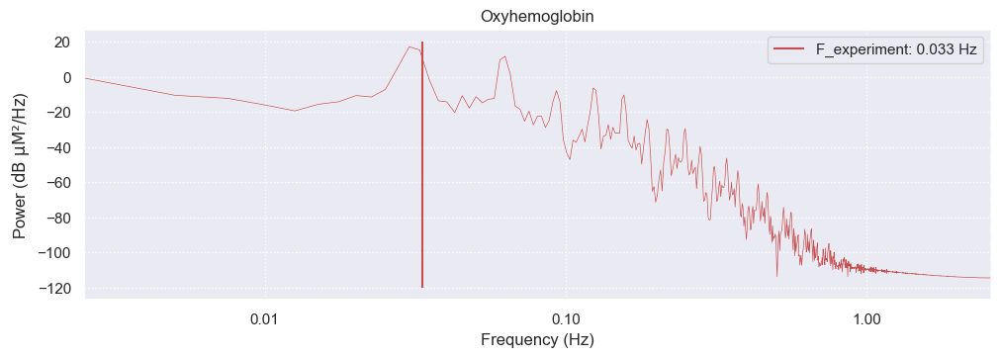

In [88]:
# Create the expected model neural response function using the data and plot the frequency spectrum.
%matplotlib inline
# This is a bit of a hack.
# Overwrite the first NIRS channel with the expected response.
# Rescale to be in expected units of uM.
hrf = raw_haemo.copy().pick(picks=[0])
hrf._data[0] = 1e-6 * (design_matrix['Grasping/Left'] + design_matrix['Grasping/Right']).T
hrf.pick(picks='hbo').compute_psd().plot(average=True, xscale='log', color='r', show=False);
plt.vlines(1/30, 20, -120, 'r', label = 'F_experiment: ' + str(round(1/30,3)) + ' Hz')
plt.legend()

##### Plot the PSD of raw measured data

Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


C:\Users\fabia\AppData\Roaming\Python\Python311\site-packages\mne\viz\utils.py:167: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


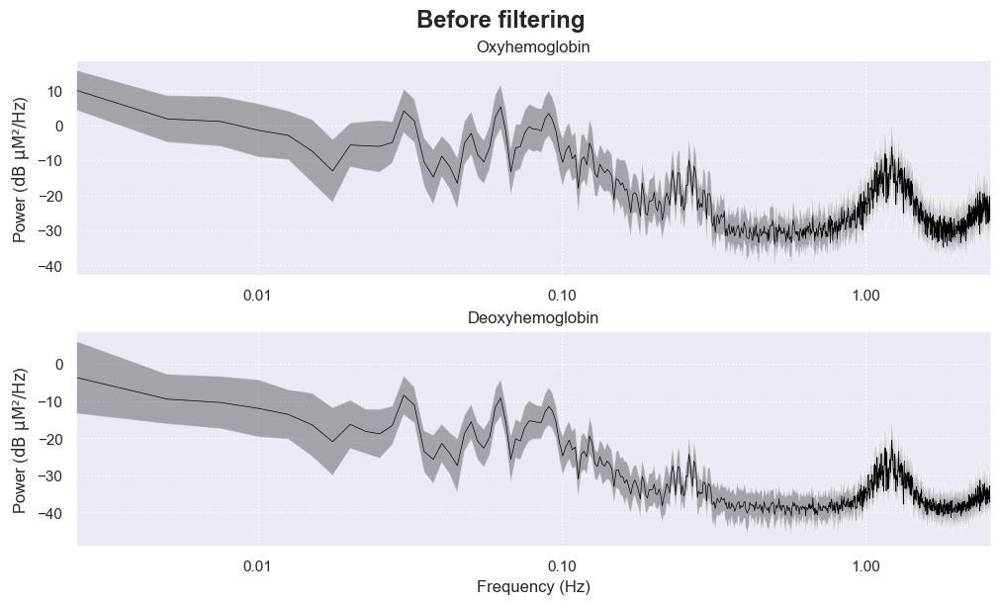

In [89]:
%matplotlib inline
fig = raw_haemo.compute_psd().plot(average=True, exclude="bads", xscale='log')
fig.suptitle('Before filtering', weight='bold', size='x-large');

##### Plot filter response

Setting up band-pass filter from 0.03 - 0.7 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.03
- Lower transition bandwidth: 0.02 Hz (-6 dB cutoff frequency: 0.02 Hz)
- Upper passband edge: 0.70 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.80 Hz)
- Filter length: 851 samples (165.094 s)



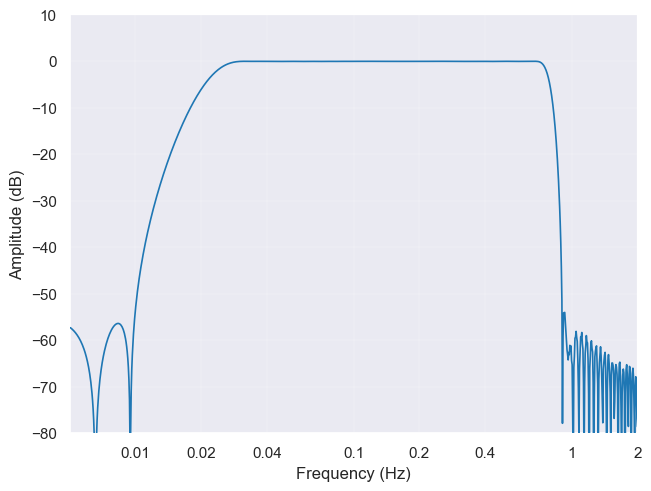

In [90]:
# Set filter charaecteristics
l_freq, h_freq, h_trans_bandwidth, l_trans_bandwidth = 0.03, 0.7, 0.2, 0.02
method = 'fir'
filter_params = mne.filter.create_filter(raw_haemo.get_data(), raw_haemo.info['sfreq'], l_freq, h_freq, h_trans_bandwidth = h_trans_bandwidth, l_trans_bandwidth = l_trans_bandwidth, filter_length='auto', method=method, iir_params=None, phase='zero', fir_window='hamming', fir_design='firwin', verbose=None)
fig = mne.viz.plot_filter(filter_params, raw_haemo.info['sfreq'], flim=(0.005, 2), fscale='log', gain=False, plot='magnitude')

Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


C:\Users\fabia\AppData\Roaming\Python\Python311\site-packages\mne\viz\utils.py:167: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


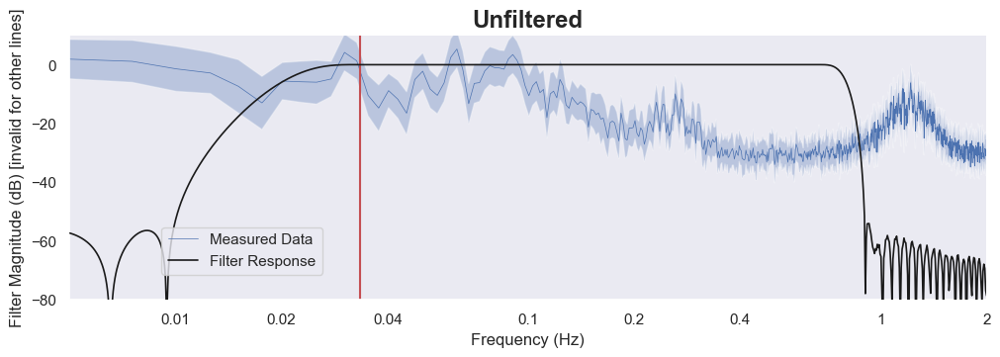

In [91]:
# Combine in one plot
fig = raw_haemo.pick(picks='hbo').compute_psd().plot(average=True, exclude="bads", xscale='log', color = 'b')
mne.viz.plot_filter(filter_params, raw_haemo.info['sfreq'], flim=(0.005, 2), fscale='log', gain=False, plot='magnitude', axes=fig.axes, show=False, color = 'k')
plt.vlines(1/30, 20, -120, 'r')

leg_lines = [line for line in fig.axes[0].lines if line.get_linestyle() == '-']
fig.legend(leg_lines, ['Measured Data', 'Filter Response'], loc="lower left", bbox_to_anchor=(0.15, 0.2))
fig.axes[0].set_ylabel('Filter Magnitude (dB) [invalid for other lines]')
fig.axes[0].set_title('Unfiltered', weight='bold', size='x-large');

##### Plot filtered signal

In [92]:
raw_haemo_filtered = raw_haemo.copy()
# Filter Haemoglobin concetraion
raw_haemo_filtered.filter(l_freq, h_freq, h_trans_bandwidth = h_trans_bandwidth, l_trans_bandwidth = l_trans_bandwidth)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.03 - 0.7 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.03
- Lower transition bandwidth: 0.02 Hz (-6 dB cutoff frequency: 0.02 Hz)
- Upper passband edge: 0.70 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.80 Hz)
- Filter length: 851 samples (165.094 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    0.0s finished


<RawSNIRF | hand grasp 2_polak__20240215-131236.snirf, 26 x 4394 (852.2 s), ~925 kB, data loaded>

Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


C:\Users\fabia\AppData\Roaming\Python\Python311\site-packages\mne\viz\utils.py:167: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


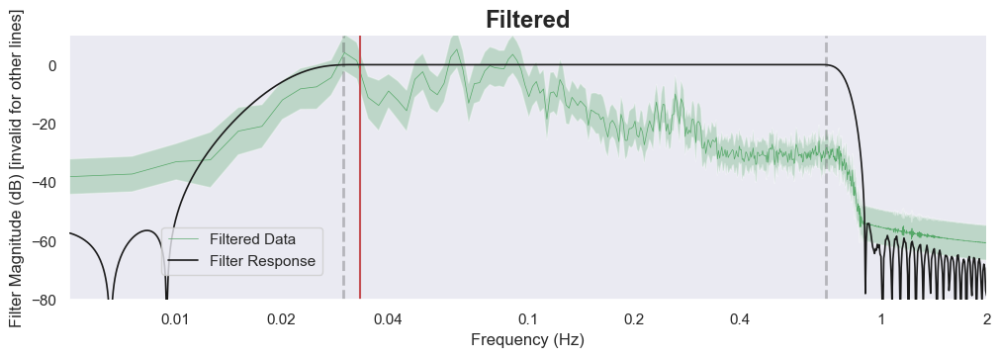

In [93]:
# Combine in one plot
fig = raw_haemo_filtered.pick(picks='hbo').compute_psd().plot(average=True, exclude="bads", xscale='log', color = 'g')
mne.viz.plot_filter(filter_params, raw_haemo.info['sfreq'], flim=(0.005, 2), fscale='log', gain=False, plot='magnitude', axes=fig.axes, show=False, color = 'k')
plt.vlines(1/30, 20, -120, 'r')

leg_lines = [line for line in fig.axes[0].lines if line.get_linestyle() == '-']
fig.legend(leg_lines, ['Filtered Data', 'Filter Response'], loc="lower left", bbox_to_anchor=(0.15, 0.2))
fig.axes[0].set_ylabel('Filter Magnitude (dB) [invalid for other lines]')
fig.axes[0].set_title('Filtered', weight='bold', size='x-large');

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


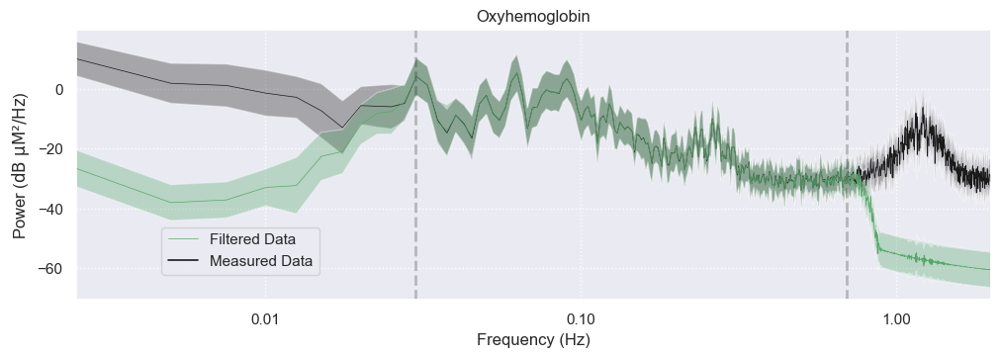

In [94]:
fig = raw_haemo.plot_psd(average=True, fmax=2, xscale='log', color='k', show=False);
raw_haemo_filtered.plot_psd(average=True, fmax=2, xscale='log', ax=fig.axes, color='g', show=False);
fig.legend(leg_lines, ['Filtered Data', 'Measured Data'], loc="lower left", bbox_to_anchor=(0.15, 0.2))

Effective window size : 397.312 (s)
Effective window size : 397.312 (s)


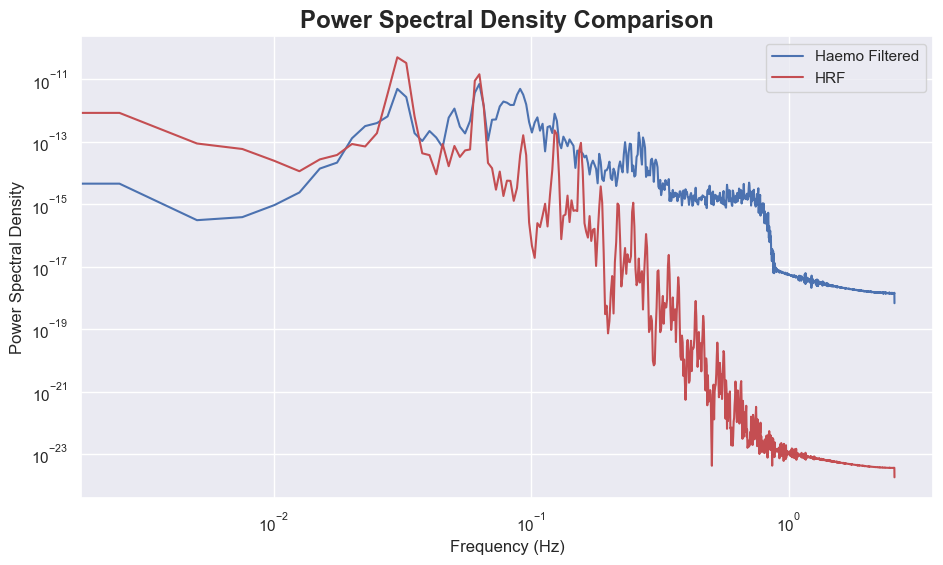

In [95]:
# Compute PSD for the first dataset
psd_haemo_filtered = raw_haemo_filtered.pick(picks='hbo').compute_psd()
psd_haemo_data, psd_haemo_freqs = psd_haemo_filtered.get_data(return_freqs = True)
psd_haemo_data = np.mean(psd_haemo_data, axis = 0)
# Compute PSD for the second dataset
psd_hrf = hrf.pick(picks='hbo').compute_psd()
psd_hrf_data, psd_hrf_freqs = psd_hrf.get_data(return_freqs = True)

# Plotting both PSDs on the same graph
plt.figure(figsize=(11, 6))
plt.plot(psd_haemo_freqs, psd_haemo_data.T, label='Haemo Filtered', color='b')
plt.plot(psd_hrf_freqs, psd_hrf_data.T, label='HRF', color='r')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')
plt.legend()
plt.title('Power Spectral Density Comparison', weight='bold', size='x-large')
plt.show()


##### Repeat with Butterworth filter

Setting up band-pass filter from 0.03 - 0.7 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 0.03, 0.70 Hz: -6.02, -6.02 dB



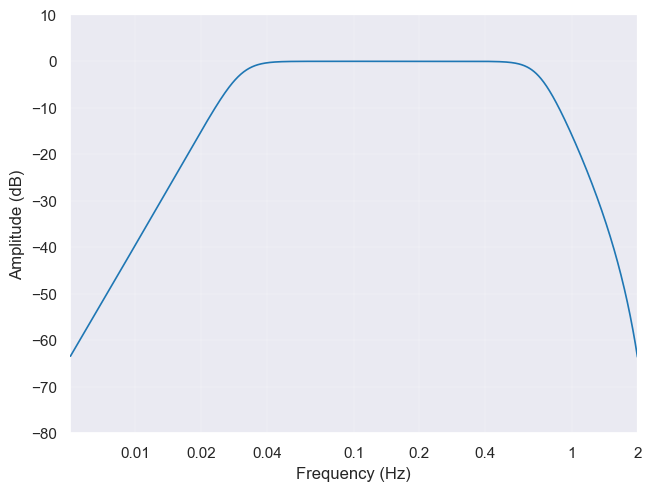

In [96]:
# Set filter charaecteristics
l_freq, h_freq, h_trans_bandwidth, l_trans_bandwidth = 0.03, 0.7, 0.2, 0.02
method2 = 'iir'
filter_params2 = mne.filter.create_filter(raw_haemo.get_data(), raw_haemo.info['sfreq'], l_freq, h_freq, h_trans_bandwidth = h_trans_bandwidth, l_trans_bandwidth = l_trans_bandwidth, filter_length='auto', method=method2, iir_params=None, phase='zero', fir_window='hamming', fir_design='firwin', verbose=None)
fig = mne.viz.plot_filter(filter_params2, raw_haemo.info['sfreq'], flim=(0.005, 2), fscale='log', gain=False, plot='magnitude')

Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


C:\Users\fabia\AppData\Roaming\Python\Python311\site-packages\mne\viz\utils.py:167: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


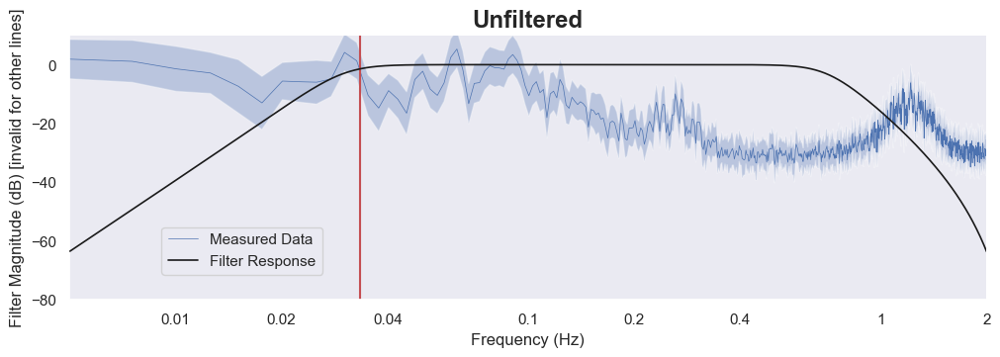

In [97]:
# Combine in one plot
fig = raw_haemo.pick(picks='hbo').compute_psd().plot(average=True, exclude="bads", xscale='log', color = 'b')
mne.viz.plot_filter(filter_params2, raw_haemo.info['sfreq'], flim=(0.005, 2), fscale='log', gain=False, plot='magnitude', axes=fig.axes, show=False, color = 'k')
plt.vlines(1/30, 20, -120, 'r')

leg_lines = [line for line in fig.axes[0].lines if line.get_linestyle() == '-']
fig.legend(leg_lines, ['Measured Data', 'Filter Response'], loc="lower left", bbox_to_anchor=(0.15, 0.2))
fig.axes[0].set_ylabel('Filter Magnitude (dB) [invalid for other lines]')
fig.axes[0].set_title('Unfiltered', weight='bold', size='x-large');

In [98]:
raw_haemo_filtered2 = raw_haemo.copy()
# Filter Haemoglobin concentration with zero phase 4th order Butterworth
raw_haemo_filtered2.filter(l_freq, h_freq, h_trans_bandwidth = h_trans_bandwidth, l_trans_bandwidth = l_trans_bandwidth, method = method2)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.03 - 0.7 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 0.03, 0.70 Hz: -6.02, -6.02 dB



<RawSNIRF | hand grasp 2_polak__20240215-131236.snirf, 26 x 4394 (852.2 s), ~925 kB, data loaded>

Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


C:\Users\fabia\AppData\Roaming\Python\Python311\site-packages\mne\viz\utils.py:167: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


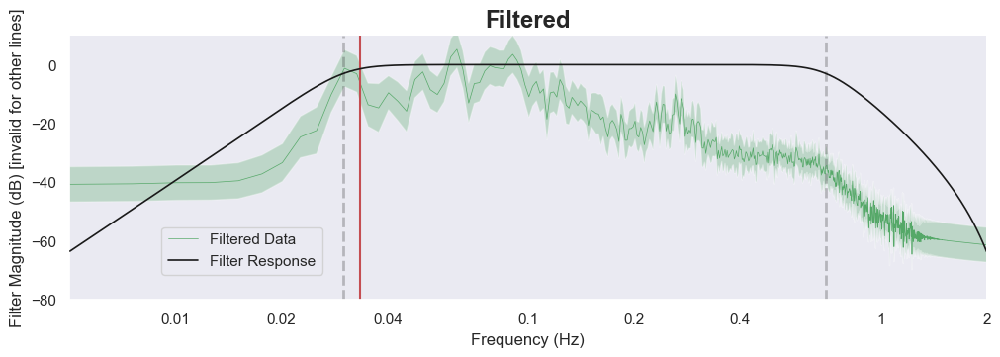

In [99]:
# Combine in one plot
fig = raw_haemo_filtered2.pick(picks='hbo').compute_psd().plot(average=True, exclude="bads", xscale='log', color = 'g')
mne.viz.plot_filter(filter_params2, raw_haemo.info['sfreq'], flim=(0.005, 2), fscale='log', gain=False, plot='magnitude', axes=fig.axes, show=False, color = 'k')
plt.vlines(1/30, 20, -120, 'r')

leg_lines = [line for line in fig.axes[0].lines if line.get_linestyle() == '-']
fig.legend(leg_lines, ['Filtered Data', 'Filter Response'], loc="lower left", bbox_to_anchor=(0.15, 0.2))
fig.axes[0].set_ylabel('Filter Magnitude (dB) [invalid for other lines]')
fig.axes[0].set_title('Filtered', weight='bold', size='x-large');

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 397.312 (s)
Plotting power spectral density (dB=True).


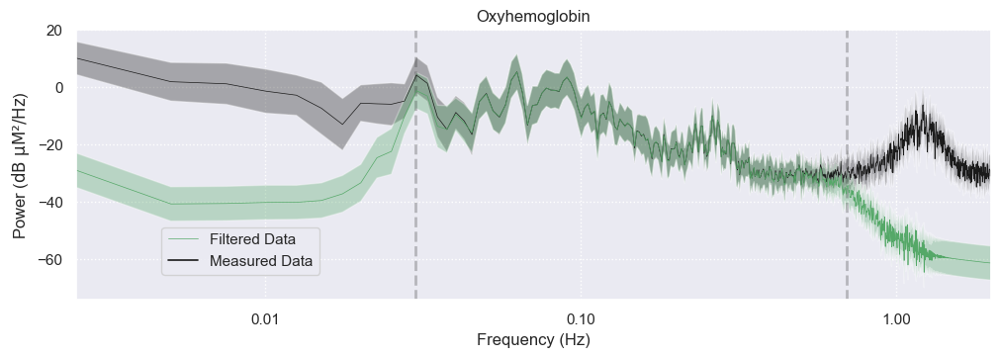

In [100]:
fig = raw_haemo.plot_psd(average=True, fmax=2, xscale='log', color='k', show=False);
raw_haemo_filtered2.plot_psd(average=True, fmax=2, xscale='log', ax=fig.axes, color='g', show=False);
fig.legend(leg_lines, ['Filtered Data', 'Measured Data'], loc="lower left", bbox_to_anchor=(0.15, 0.2))

Effective window size : 397.312 (s)
Effective window size : 397.312 (s)


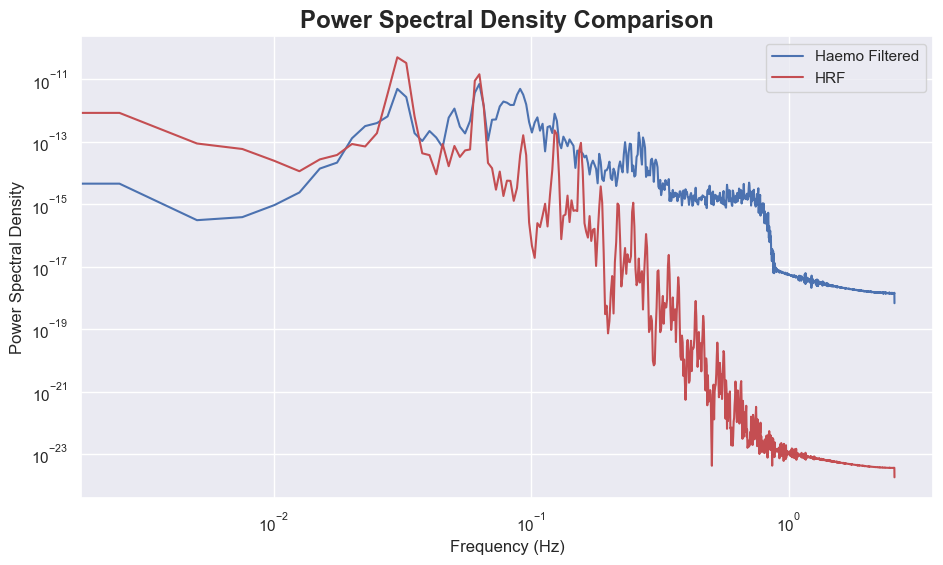

In [101]:
# Compute PSD for the first dataset
psd_haemo_filtered = raw_haemo_filtered.pick(picks='hbo').compute_psd()
psd_haemo_data, psd_haemo_freqs = psd_haemo_filtered.get_data(return_freqs = True)
psd_haemo_data = np.mean(psd_haemo_data, axis = 0)
# Compute PSD for the second dataset
psd_hrf = hrf.pick(picks='hbo').compute_psd()
psd_hrf_data, psd_hrf_freqs = psd_hrf.get_data(return_freqs = True)

# Plotting both PSDs on the same graph
plt.figure(figsize=(11, 6))
plt.plot(psd_haemo_freqs, psd_haemo_data.T, label='Haemo Filtered', color='b')
plt.plot(psd_hrf_freqs, psd_hrf_data.T, label='HRF', color='r')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')
plt.legend()
plt.title('Power Spectral Density Comparison', weight='bold', size='x-large')
plt.show()


#### Principal Component Analysis <a class="anchor" id="sub_section_1_5_2"></a>

#### Independent Component Analysis <a class="anchor" id="sub_section_1_5_3"></a>

#### FOOOF  <a class="anchor" id="sub_section_1_5_4"></a>

FOOOF stands for \textit{fitting oscillations and one over f} and was developed originally for  electrophysiological data, such as EEG, by Donoghue et al. (2020). According to the developers, FOOOF is a fast, efficient, and physiologically-informed tool to parameterize neural power spectra.

In fNIRS research, the FOOOF algorithm can be utilized to quantify Mayer wave parameters. Mayer waves are challenging to remove from the haemodynamic signals of brain activity because their frequencies often coincide with those of sensory tasks and/or the cortical haemodynamic response to those tasks. FOOOF will fit of a periodic and aperiodic component to the power spectrum of the fNIRS data and the goal is to  fit a periodic component to the peak at around 0.1 Hz that reflects the Mayer wave activity. Once this component is identified, it can then be filtered out.

##### Process data with FOOOF

Effective window size : 116.400 (s)


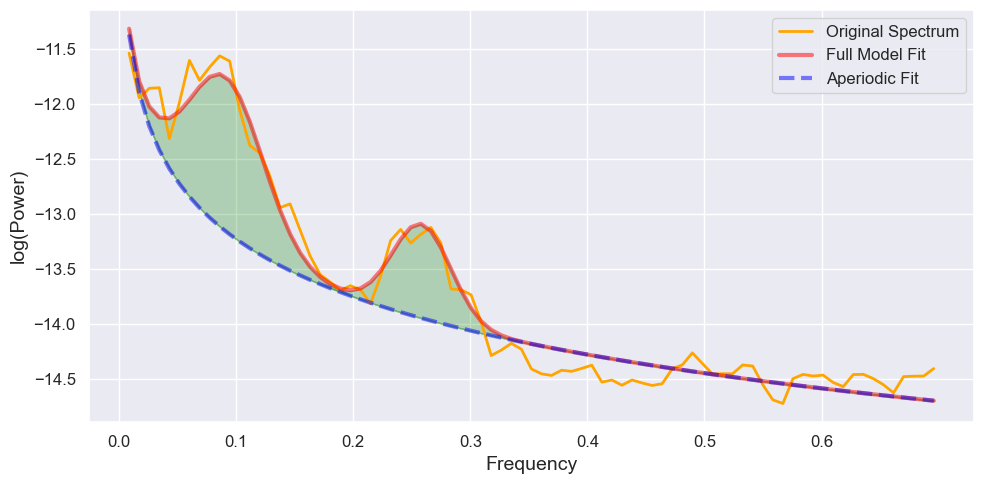

In [102]:
# Prepare data for FOOOF (DOI: 10.1038/s41593-020-00744-x)
# Estimate the power spectral density of the data and pass this to the FOOOF algorithm
psd = raw_haemo.compute_psd(fmin=0.001, fmax=1.0, tmin=0, tmax=None, n_overlap=300, n_fft=600)

spectra, freqs = psd.get_data(return_freqs=True)
# FOOOF requires the frequency values to be higher than the fNIRS data permits, so we scale the values up by 10 here,
# and then will scale the frequency values down by 10 later.
spectra, freqs = scale_up_spectra(spectra, freqs) 

# Specify the model, note that frequency values here are times 10
fm = FOOOF(peak_width_limits=(0.5, 12.0))
# Set the frequency range to fit the model, again these are times 10
freq_range = [0.001, 7]

fm.fit(freqs, np.mean(spectra, axis=0), freq_range)

# Plot in semi-log space (log10 power values and linear frequencies)
%matplotlib inline
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
fm.plot(plot_peaks='shade', data_kwargs={'color': 'orange'}, ax=axs)
# Correct for x10 scaling above
plt.xticks([0, 1, 2, 3, 4, 5, 6], [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]);

##### Quantify Mayer wave oscillation

In [103]:
quantify_mayer_fooof(raw_haemo.copy().pick("hbo"), extra_df_fields={"Study": "Polak 1"})

Effective window size : 77.600 (s)


,Centre Frequency,Bandwidth,Power,Chromaphore,Study
0,0.089688,0.065152,1.408625,hbo,Polak 1


---
> *Remark:*
- The algorithm manages to find a periodic component with a center frequency around 0.1 Hz which could be assigned to Mayer waves
- A second periodic component is found with $f_c$ equal to approximately 2.5 Hz. Related to breathing? period of 4 seconds
- c   
---

#### Adaptive filtering <a class="anchor" id="sub_section_1_5_5"></a>